## 赛题A：智能运维中的异常检测与趋势预测

In [1]:
%config InlineBackend.figure_format = 'retina'
%matplotlib inline    
import seaborn as sns 
sns.set(font= "Kaiti",style="ticks",font_scale=1.4)
import matplotlib
matplotlib.rcParams['axes.unicode_minus']=False # 解决坐标轴的负号显示问题
## 导入需要的库
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from fbprophet import Prophet

### 数据导入与预处理

In [2]:
usedatadf = pd.read_excel("附件1：赛题A数据.xlsx")
usedatadf.head()

,时间,基站编号,小区编号,本地小区标识,上行可用的PRB个数,下行可用的PRB个数,上行PhysicalResourceBlock被使用的平均个数,下行PhysicalResourceBlock被使用的平均个数,上行PUSCH的PhysicalResourceBlock被使用的平均个数,小区内的平均用户数,...,用户随机接入时TA值在区间11范围的接入次数,MR测量上报RSRP在Index0区间的次数,MR测量上报RSRP在Index1区间的次数,MR测量上报RSRP在Index2区间的次数,MR测量上报RSRP在Index3区间的次数,MR测量上报RSRP在Index4区间的次数,小区QCI为1的DRB业务PDCPSDU上行丢弃的总包数包,小区QCI为1的DRB业务PDCPSDU上行期望收到的总包数,小区QCI为1的DRB业务PDCPSDU下行空口丢弃的总包数,小区QCI为1的DRB业务PDCPSDU下行空口发送的总包数
0,2021-08-28 00:00,1200071,26019014,0,100,100,6.4553,31.5065,2.1503,22.6341,...,0,3,16,17,178,9943,0,2218,0,2179
1,2021-08-28 00:00,1200071,26019015,1,100,100,8.8281,21.5452,4.2220,19.1064,...,0,2,4,21,180,8427,0,1510,0,1423
2,2021-08-28 00:00,1200071,26019016,2,100,100,5.5024,11.9276,1.8618,15.4729,...,0,2,4,48,575,6371,0,2030,0,1919
3,2021-08-28 00:00,1200071,26019023,3,100,100,3.1113,0.9637,0.0077,0.0509,...,0,0,0,0,3,31,0,0,0,0
4,2021-08-28 00:00,1200071,26019024,4,100,100,2.6004,1.0051,0.1201,0.6355,...,0,0,1,1,9,285,0,7526,0,7780


In [3]:
usedatadf.columns

Index(['时间', '基站编号', '小区编号', '本地小区标识', '上行可用的PRB个数', '下行可用的PRB个数',
       '上行PhysicalResourceBlock被使用的平均个数', '下行PhysicalResourceBlock被使用的平均个数',
       '上行PUSCH的PhysicalResourceBlock被使用的平均个数', '小区内的平均用户数', '小区内的最大用户数',
       'RRC连接建立完成次数', 'RRC连接请求次数（不包括重发）', 'ERAB建立成功总次数', 'ERAB建立尝试总次数',
       'ERAB异常释放总次数', 'ERAB正常释放总次数', '系统间切换出ERAB正常释放总次数', 'eNodeB内同频切换出成功次数',
       'eNodeB间同频切换出成功次数', 'eNodeB内同频切换出执行次数', 'eNodeB间同频切换出执行次数',
       'eNodeB内异频切换出成功次数', 'eNodeB间异频切换出成功次数', 'eNodeB内异频切换出执行次数',
       'eNodeB间异频切换出执行次数', '小区PDCP层所发送的下行数据的总吞吐量比特',
       '使缓存为空的最后一个TTI所传的下行PDCP吞吐量比', '扣除使下行缓存为空的最后一个TTI之后的数传时',
       '小区PDCP层所接收到的上行数据的总吞吐量比特', '使UE缓存为空的最后一个TTI所传的上行PDCP吞吐量',
       '扣除使UE缓存为空的最后一个TTI之后的上行数传', '平均激活用户数', '最大激活用户数', '空口上报全带宽CQI为0的次数',
       '空口上报全带宽CQI为1的次数', '空口上报全带宽CQI为2的次数', '空口上报全带宽CQI为3的次数',
       '空口上报全带宽CQI为4的次数', '空口上报全带宽CQI为5的次数', '空口上报全带宽CQI为6的次数',
       '空口上报全带宽CQI为7的次数', '空口上报全带宽CQI为8的次数', '空口上报全带宽CQI为9的次数',
       '空口上报全带宽CQI为10的次数', '空口上报全带宽CQI为11的次数', '

In [4]:
## 数据提取,获取区内的平均用户数数据，指标1
usenumdf = usedatadf.iloc[:,0:4]
usenumdf["number"] = usedatadf["小区内的平均用户数"]
usenumdf.head()

,时间,基站编号,小区编号,本地小区标识,number
0,2021-08-28 00:00,1200071,26019014,0,22.6341
1,2021-08-28 00:00,1200071,26019015,1,19.1064
2,2021-08-28 00:00,1200071,26019016,2,15.4729
3,2021-08-28 00:00,1200071,26019023,3,0.0509
4,2021-08-28 00:00,1200071,26019024,4,0.6355


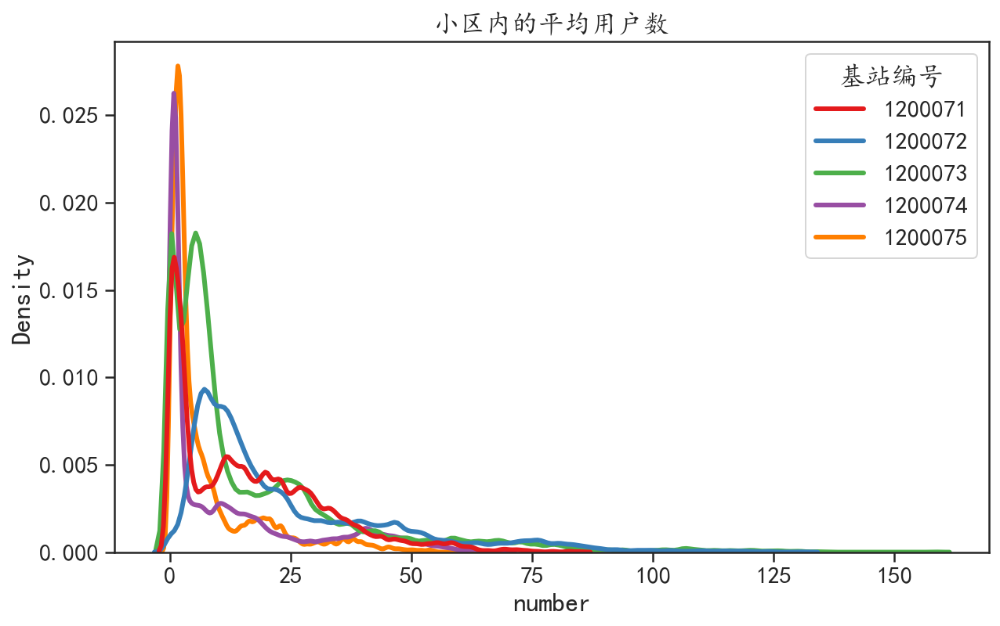

In [5]:
## 可视化平均用户数的数据分布
plt.figure(figsize=(10,6))
sns.kdeplot(data=usenumdf, x="number",bw_adjust=.3,lw = 3,
             hue="基站编号",palette = "Set1") 
plt.title("小区内的平均用户数")
plt.show()

In [6]:
## 数据提取,获取小区PDCP 流量，指标2
PDCPdf = usedatadf.iloc[:,0:4]
PDCPdf["PDCP"] = usedatadf["小区PDCP层所发送的下行数据的总吞吐量比特"]+usedatadf["小区PDCP层所接收到的上行数据的总吞吐量比特"]
PDCPdf.head()

,时间,基站编号,小区编号,本地小区标识,PDCP
0,2021-08-28 00:00,1200071,26019014,0,32161243768
1,2021-08-28 00:00,1200071,26019015,1,17015521760
2,2021-08-28 00:00,1200071,26019016,2,8961952016
3,2021-08-28 00:00,1200071,26019023,3,343112
4,2021-08-28 00:00,1200071,26019024,4,39529280


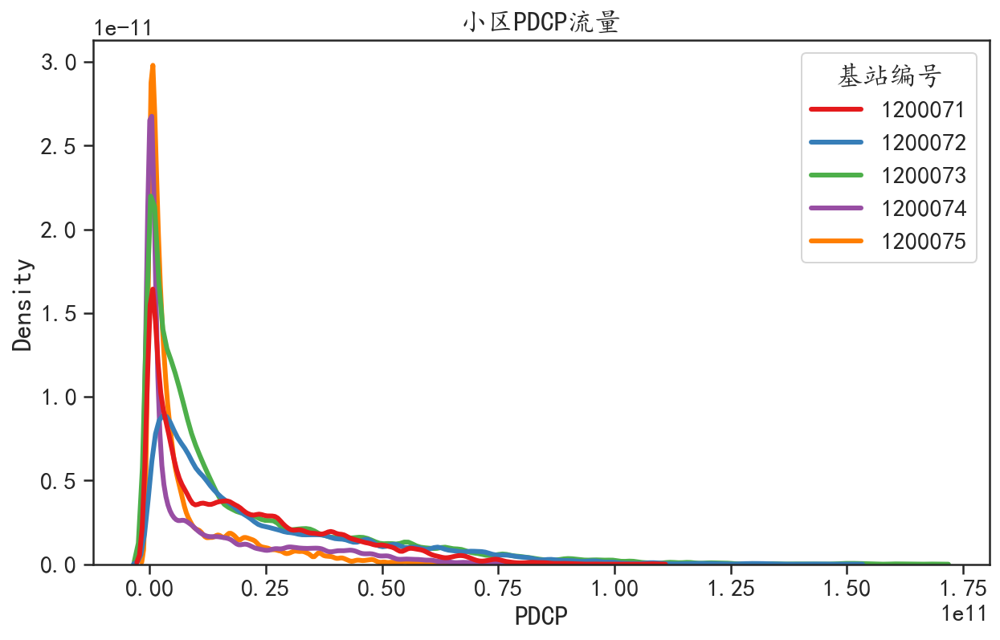

In [7]:
## 可视化小区PDCP流量的数据分布
plt.figure(figsize=(10,6))
sns.kdeplot(data=PDCPdf, x="PDCP",bw_adjust=.3,lw = 3,
             hue="基站编号",palette = "Set1") 
plt.title("小区PDCP流量")
plt.show()

In [8]:
## 数据提取,获取平均激活用户数，指标3
avgnumdf = usedatadf.iloc[:,0:4]
avgnumdf["avgnumber"] = usedatadf["平均激活用户数"]
avgnumdf.head()

,时间,基站编号,小区编号,本地小区标识,avgnumber
0,2021-08-28 00:00,1200071,26019014,0,2.7893
1,2021-08-28 00:00,1200071,26019015,1,3.9198
2,2021-08-28 00:00,1200071,26019016,2,3.1944
3,2021-08-28 00:00,1200071,26019023,3,0.0004
4,2021-08-28 00:00,1200071,26019024,4,0.0263


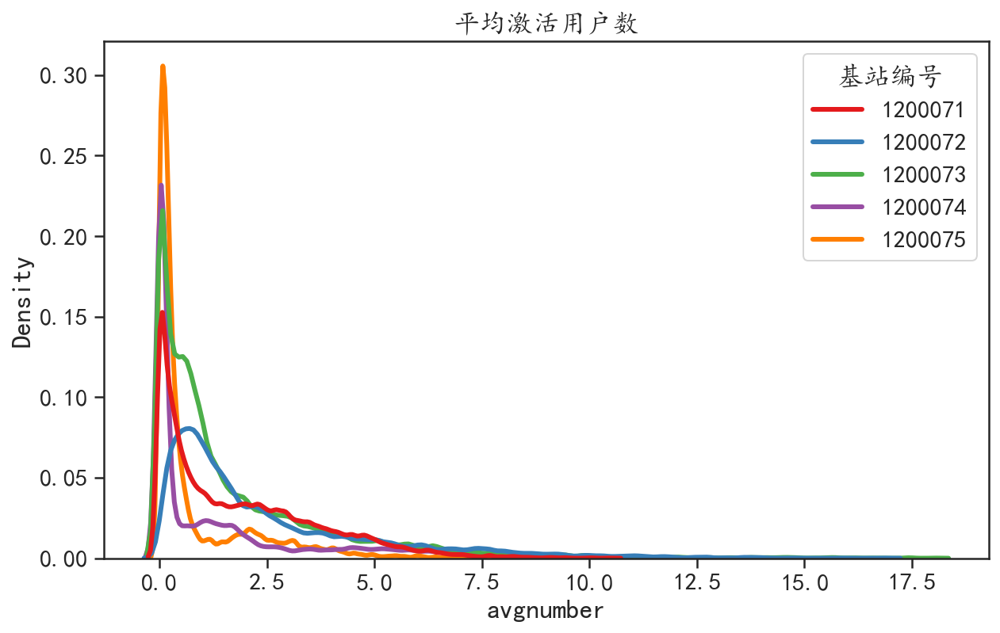

In [9]:
## 可视化小区PDCP流量的数据分布
plt.figure(figsize=(10,6))
sns.kdeplot(data=avgnumdf, x="avgnumber",bw_adjust=.3,lw = 3,
             hue="基站编号",palette = "Set1") 
plt.title("平均激活用户数")
plt.show()

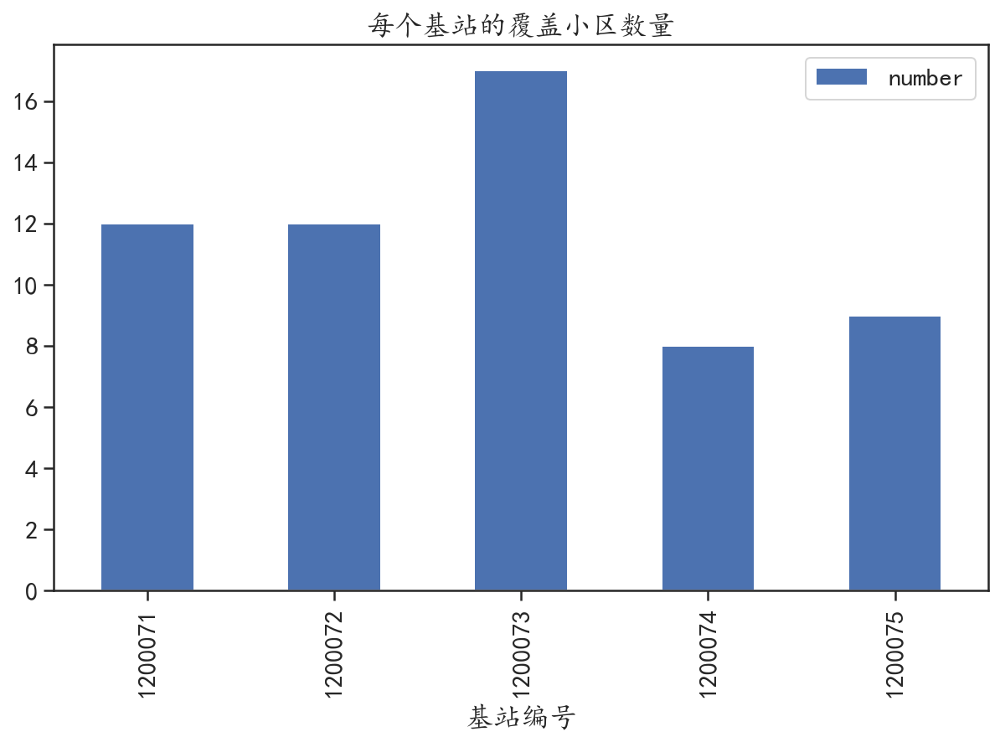

In [10]:
mydf1 = usenumdf.groupby(["基站编号","小区编号"]).count().reset_index()
mydf1 =mydf1.groupby(["基站编号"]).count().reset_index()
mydf1.plot(x = "基站编号",y = "number",kind = "bar",figsize= (10,6),
           title = "每个基站的覆盖小区数量")
plt.show()

In [11]:
## 获取一个包含三个指标的数据
myusealldf = usenumdf
myusealldf["PDCP"] = PDCPdf["PDCP"]
myusealldf["avgnumber"] = avgnumdf["avgnumber"]
myusealldf.head()

,时间,基站编号,小区编号,本地小区标识,number,PDCP,avgnumber
0,2021-08-28 00:00,1200071,26019014,0,22.6341,32161243768,2.7893
1,2021-08-28 00:00,1200071,26019015,1,19.1064,17015521760,3.9198
2,2021-08-28 00:00,1200071,26019016,2,15.4729,8961952016,3.1944
3,2021-08-28 00:00,1200071,26019023,3,0.0509,343112,0.0004
4,2021-08-28 00:00,1200071,26019024,4,0.6355,39529280,0.0263


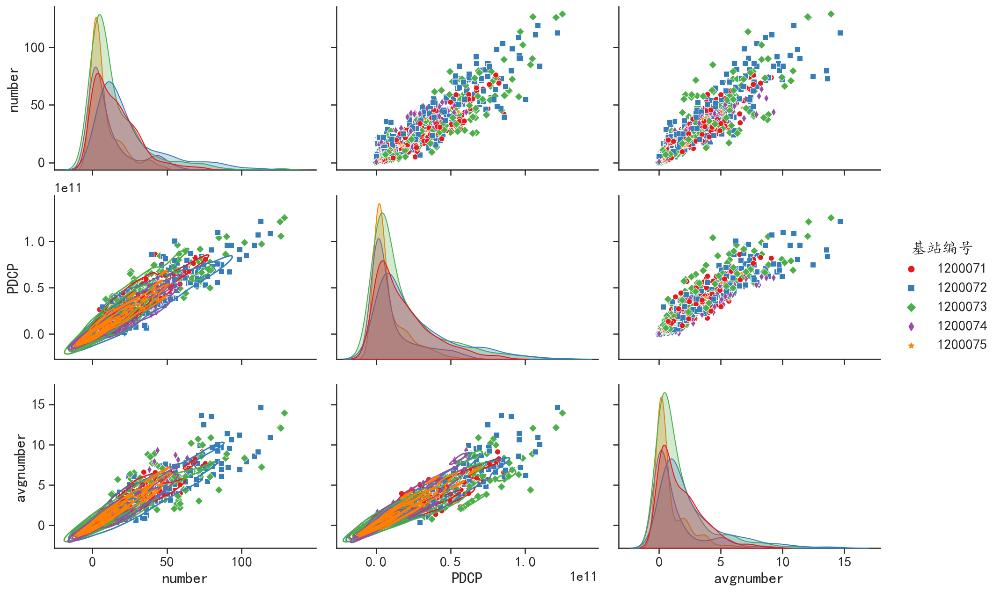

In [12]:
## 可视化三个指标的相关性
index = np.random.permutation(len(myusealldf))[0:2000] # 可视化部分数据
p = sns.pairplot(myusealldf.iloc[index,[1,4,5,6]], hue="基站编号",
                 markers = ["o", "s", "D","d","*"],
                 palette = "Set1",
                 height=3,aspect=3/2) 
p.map_lower(sns.kdeplot, levels=10) ## 为下三角区域添加密度曲线
plt.show()

## 三个指标之间有较强的相关性

### 数据可视化

可视化每个小区相应指标的数据波动趋势，以观察数据的变化情况

In [13]:
usenumdf.head()

,时间,基站编号,小区编号,本地小区标识,number,PDCP,avgnumber
0,2021-08-28 00:00,1200071,26019014,0,22.6341,32161243768,2.7893
1,2021-08-28 00:00,1200071,26019015,1,19.1064,17015521760,3.9198
2,2021-08-28 00:00,1200071,26019016,2,15.4729,8961952016,3.1944
3,2021-08-28 00:00,1200071,26019023,3,0.0509,343112,0.0004
4,2021-08-28 00:00,1200071,26019024,4,0.6355,39529280,0.0263


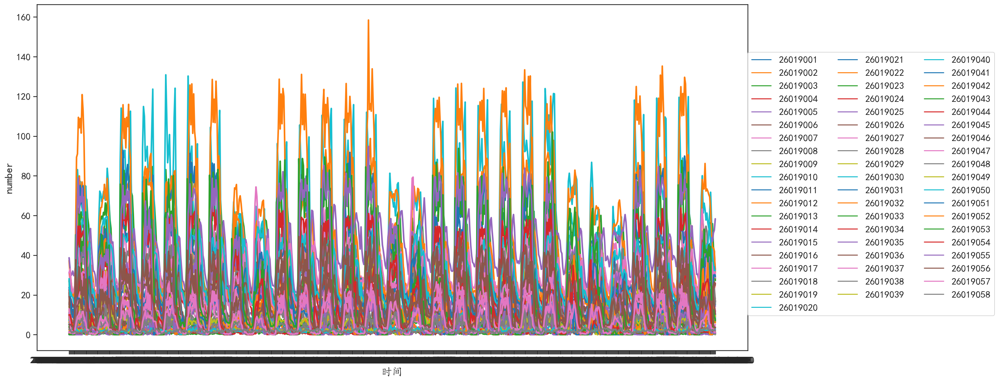

In [14]:
## 可视化平均用户数数据

plt.figure(figsize=(20,10))
sns.lineplot(data=usenumdf,x = "时间",y = "number",hue = "小区编号", palette="tab10", linewidth=2.5)
plt.legend(loc= (1,0.1),ncol=3)
plt.show()
## 不便于观察，可视化部分数据

In [15]:
## 获取所有小区的编号
xiaoqu = np.unique(usenumdf["小区编号"])
xiaoqu

array([26019001, 26019002, 26019003, 26019004, 26019005, 26019006,
       26019007, 26019008, 26019009, 26019010, 26019011, 26019012,
       26019013, 26019014, 26019015, 26019016, 26019017, 26019018,
       26019019, 26019020, 26019021, 26019022, 26019023, 26019024,
       26019025, 26019026, 26019027, 26019028, 26019029, 26019030,
       26019031, 26019032, 26019033, 26019034, 26019035, 26019036,
       26019037, 26019038, 26019039, 26019040, 26019041, 26019042,
       26019043, 26019044, 26019045, 26019046, 26019047, 26019048,
       26019049, 26019050, 26019051, 26019052, 26019053, 26019054,
       26019055, 26019056, 26019057, 26019058])

In [16]:
## 只可视化其中几个小区的数据
[True for element in xiaoqu[0:5] if element in xiaoqu]

[True, True, True, True, True]

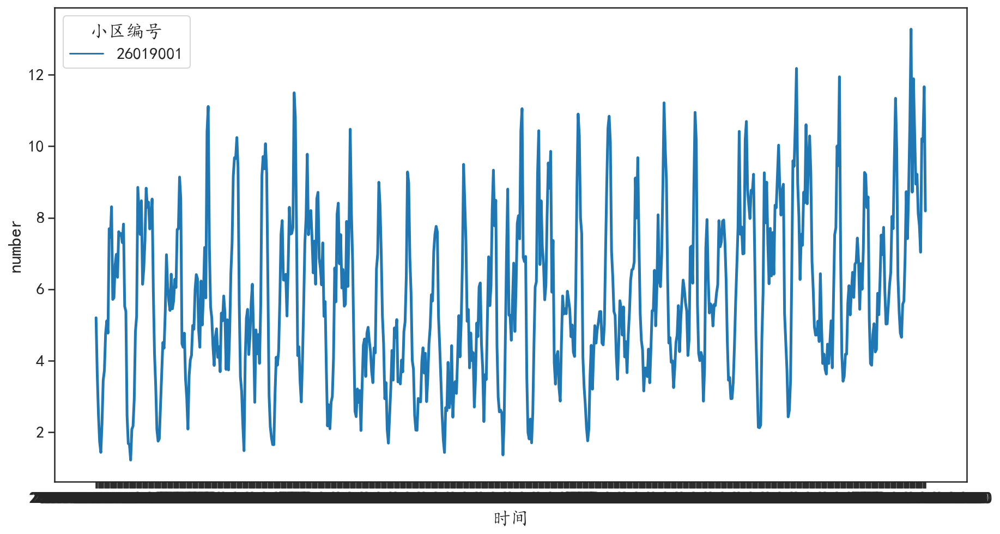

In [17]:
plt.figure(figsize=(15,8))
sns.lineplot(data=usenumdf.loc[usenumdf["小区编号"] == 26019001,:],x = "时间",y = "number",
             hue = "小区编号", palette="tab10", linewidth=2.5)
plt.show()

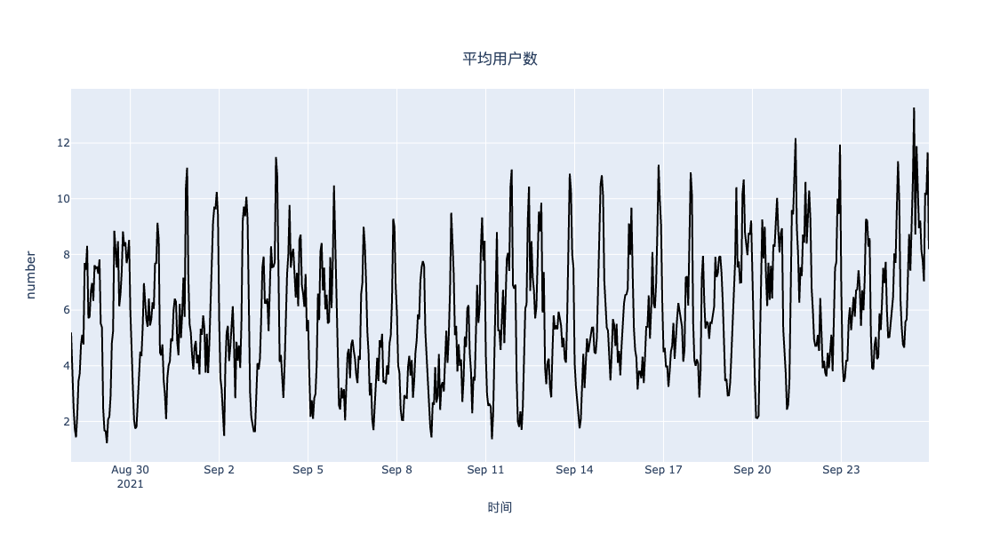

In [18]:
## 获取可交互的图像
fig = px.line(usenumdf.loc[usenumdf["小区编号"] == 26019001,:],x = "时间",y = "number",width=1000, height=600,
              title = "平均用户数")
fig.update_traces(line=dict(width=2, color="black"))
fig.update_layout(title={"x":0.5,"y":0.9})
fig.show()

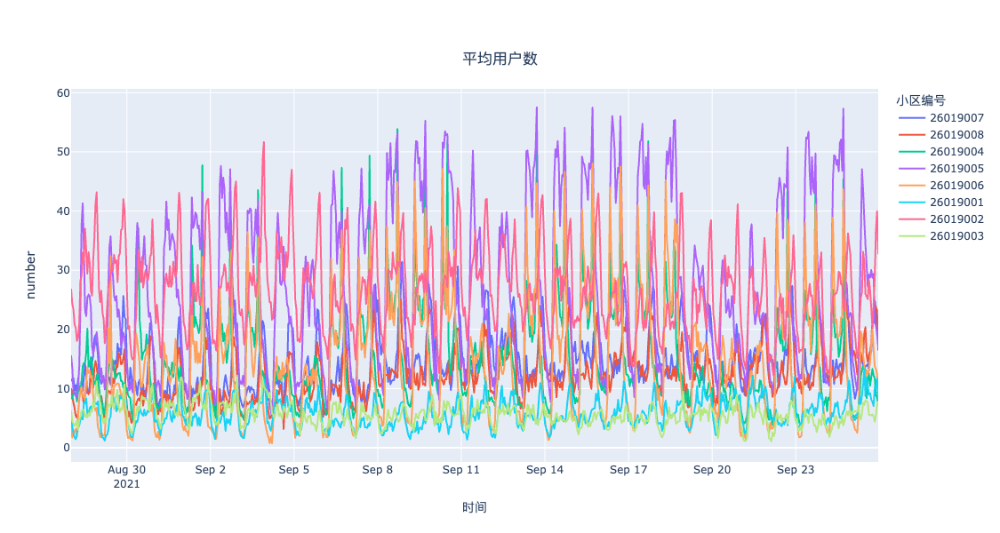

In [19]:
## 可视化多个小区的数据，获取可交互的图像
fig = px.line(usenumdf.loc[usenumdf["小区编号"] <= 26019008,:],x = "时间",y = "number",width=1000, height=600,
              title = "平均用户数",color = "小区编号")
fig.update_traces(line=dict(width=2))
fig.update_layout(title={"x":0.5,"y":0.9})
fig.show()

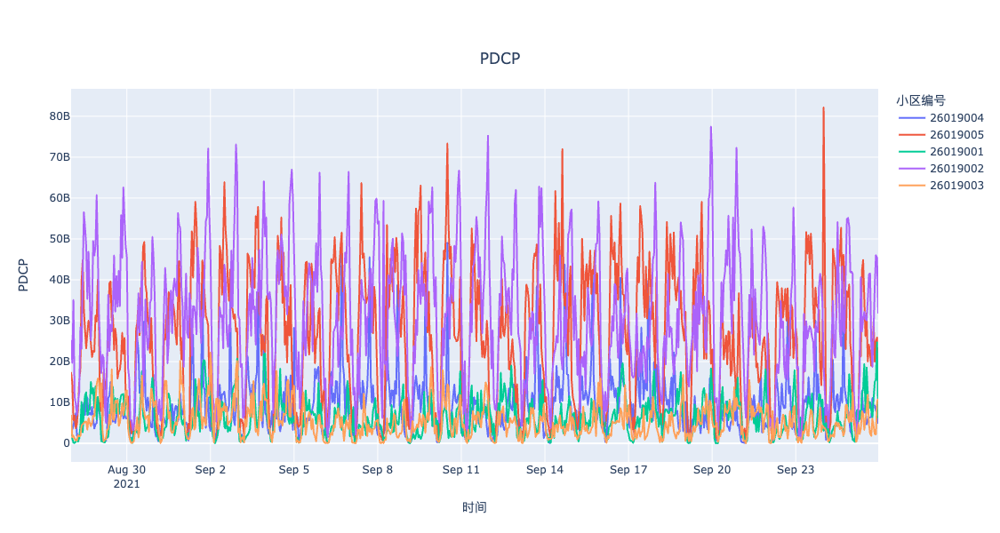

In [20]:
## 可视化多个小区的数据，获取可交互的图像
fig = px.line(myusealldf.loc[myusealldf["小区编号"] <= 26019005,:],x = "时间",y = "PDCP",width=1000, height=600,
              title = "PDCP",color = "小区编号")
fig.update_traces(line=dict(width=2))
fig.update_layout(title={"x":0.5,"y":0.9})
fig.show()

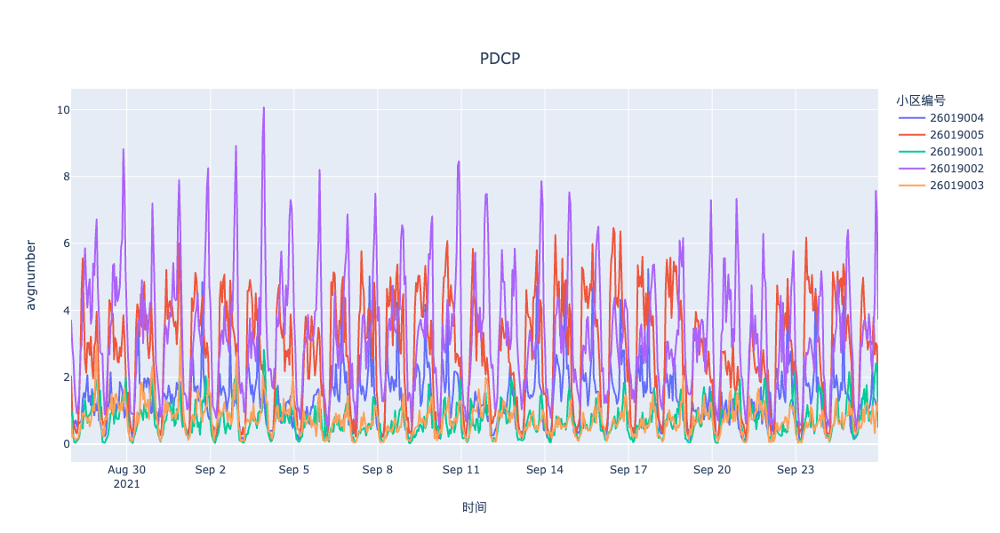

In [21]:
## 可视化多个小区的数据，获取可交互的图像
fig = px.line(myusealldf.loc[myusealldf["小区编号"] <= 26019005,:],x = "时间",y = "avgnumber",width=1000, height=600,
              title = "PDCP",color = "小区编号")
fig.update_traces(line=dict(width=2))
fig.update_layout(title={"x":0.5,"y":0.9})
fig.show()

### 对其中一个小区的数据建立时间序列模型，并识别是否存在异常值

In [22]:
## 数据准备
predf = myusealldf.loc[myusealldf["小区编号"] == 26019005,["时间","number"]]
predf.columns = ["ds","y"]
predf.ds = pd.to_datetime(predf.ds,format = "%Y-%m-%d %H:%M")
predf

,ds,y
18,2021-08-28 00:00:00,15.5100
76,2021-08-28 01:00:00,13.5003
134,2021-08-28 02:00:00,9.3439
192,2021-08-28 03:00:00,9.3711
250,2021-08-28 04:00:00,8.6753
...,...,...
40096,2021-09-25 19:00:00,29.3806
40154,2021-09-25 20:00:00,21.1153
40212,2021-09-25 21:00:00,20.7158
40270,2021-09-25 22:00:00,19.1725


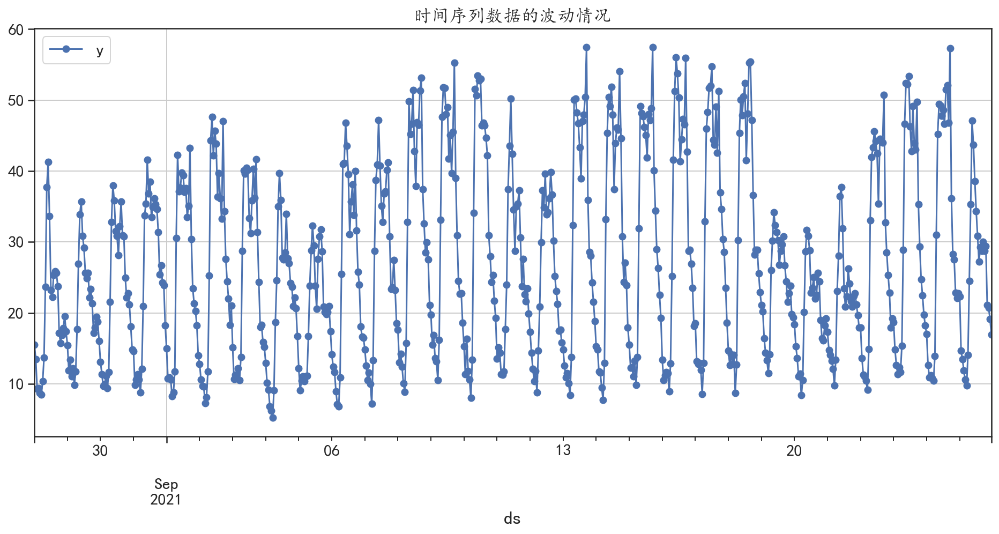

In [23]:
## 可视化时间序列的变化情况
predf.plot(x = "ds",y = "y",style = "b-o",figsize=(16,7))
plt.grid()
plt.title("时间序列数据的波动情况")
plt.show()

In [24]:
## 针对前面的时序数据，可以使用下面的程序获得时序数据拟合模型，对数据变化趋势和波动情况进行拟合，并且在模型的预测结果中包含预测值的上界和下界（默认为置信度95%的上下界）。
## 定义一个函数outlier_detection()，该函数会使用模型预测值的置信区间的上下界，来判断样本是否为异常值，
## 根据模型预测值的置信区间"yhat_lower"和"yhat_upper"判断样本是否为异常值
def outlier_detection(forecast):
    index = np.where((forecast["y"] <= forecast["yhat_lower"])|
                     (forecast["y"] >= forecast["yhat_upper"]),True,False)
    return index


In [25]:
## 对该数据建立一个时间序列模型
np.random.seed(1234)  ## 设置随机数种子
model = Prophet(growth="linear",daily_seasonality = True,
                weekly_seasonality=True,yearly_seasonality=False,
                seasonality_mode = 'multiplicative', 
                interval_width = 0.95,   ## 获取95%的置信区间
                )
model = model.fit(predf)     # 使用数据拟合模型
forecast = model.predict(predf)  # 使用模型对数据进行预测
forecast["y"] = predf["y"].reset_index(drop = True)
forecast["yhat"] = np.where(forecast["yhat"]<0,0,forecast["yhat"])
forecast["yhat_lower"] = np.where(forecast["yhat_lower"]<0,0,forecast["yhat_lower"])
forecast[["ds","y","yhat","yhat_lower","yhat_upper"]].head()
## 如果yhat_lower活着yhat小于0，则修改为0


Initial log joint probability = -32.8427
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1355.85    0.00166816       83.4561           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       1356.53   0.000162473       77.5984   2.582e-06       0.001      276  LS failed, Hessian reset 
     199       1356.54   1.38495e-05       84.9198      0.6384      0.6384      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       1356.56   3.34127e-06       54.0073   4.784e-08       0.001      369  LS failed, Hessian reset 
     261       1356.57   2.10543e-05       73.9325   3.224e-07       0.001      455  LS failed, Hessian reset 
     299       1356.57   1.06392e-06       64.9042      0.7121      0.7121      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

,ds,y,yhat,yhat_lower,yhat_upper
0,2021-08-28 00:00:00,15.5100,13.832869,3.915429,23.091424
1,2021-08-28 01:00:00,13.5003,12.229369,3.206737,22.191514
2,2021-08-28 02:00:00,9.3439,10.866993,0.886551,20.462700
3,2021-08-28 03:00:00,9.3711,9.338182,0.000000,19.411900
4,2021-08-28 04:00:00,8.6753,8.043085,0.000000,18.041248


In [26]:
## 查看异常值预测情况
outlier_index = outlier_detection(forecast)
outlier_df = predf[outlier_index]
print("异常值的数量为:",np.sum(outlier_index))

异常值的数量为: 42


In [27]:
outlier_df

,ds,y
7964,2021-09-02 17:00:00,47.0583
10226,2021-09-04 08:00:00,24.5867
11676,2021-09-05 09:00:00,28.7775
15794,2021-09-08 08:00:00,49.7990
16316,2021-09-08 17:00:00,53.1923
17708,2021-09-09 17:00:00,55.2697
18578,2021-09-10 08:00:00,51.5614
18810,2021-09-10 12:00:00,52.9775
21478,2021-09-12 10:00:00,34.8264
22754,2021-09-13 08:00:00,50.0628


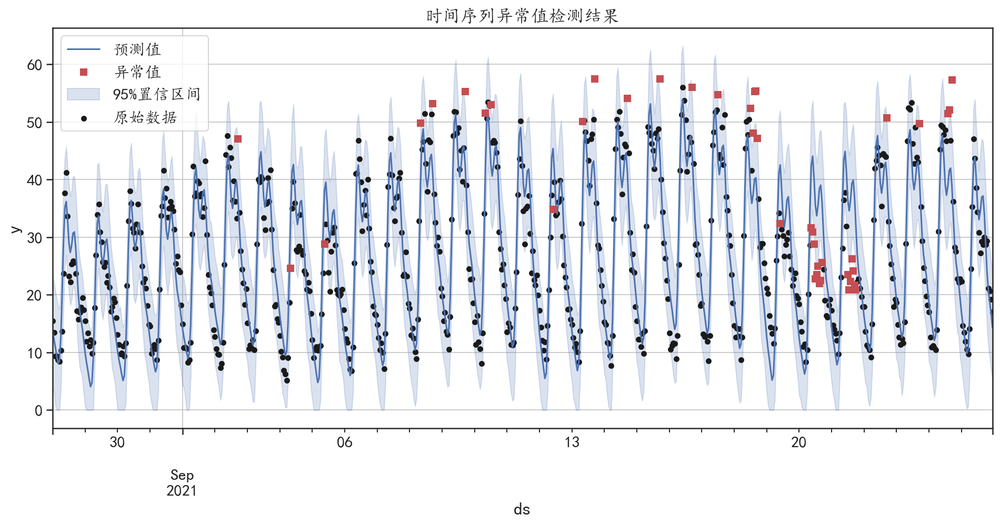

In [28]:
## 可视化异常值的结果
fig, ax = plt.subplots()
## 可视化预测值
forecast.plot(x = "ds",y = "yhat",style = "b-",figsize=(16,7),
              label = "预测值",ax=ax)
## 可视化出置信区间
ax.fill_between(forecast["ds"].values, forecast["yhat_lower"], 
                forecast["yhat_upper"],color='b',alpha=.2,
                label = "95%置信区间")
forecast.plot(kind = "scatter",x = "ds",y = "y",c = "k",
              s = 20,label = "原始数据",ax = ax)
## 可视化出异常值的点
outlier_df.plot(x = "ds",y = "y",style = "rs",ax = ax,
                label = "异常值")
plt.legend(loc = 2)
plt.grid()
plt.title("时间序列异常值检测结果")
plt.show()

Initial log joint probability = -32.8427
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1355.85    0.00166816       83.4561           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       1356.53   0.000162473       77.5984   2.582e-06       0.001      276  LS failed, Hessian reset 
     199       1356.54   1.38495e-05       84.9198      0.6384      0.6384      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     218       1356.56   3.34127e-06       54.0073   4.784e-08       0.001      369  LS failed, Hessian reset 
     261       1356.57   2.10543e-05       73.9325   3.224e-07       0.001      455  LS failed, Hessian reset 
     299       1356.57   1.06392e-06       64.9042      0.7121      0.7121      506   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

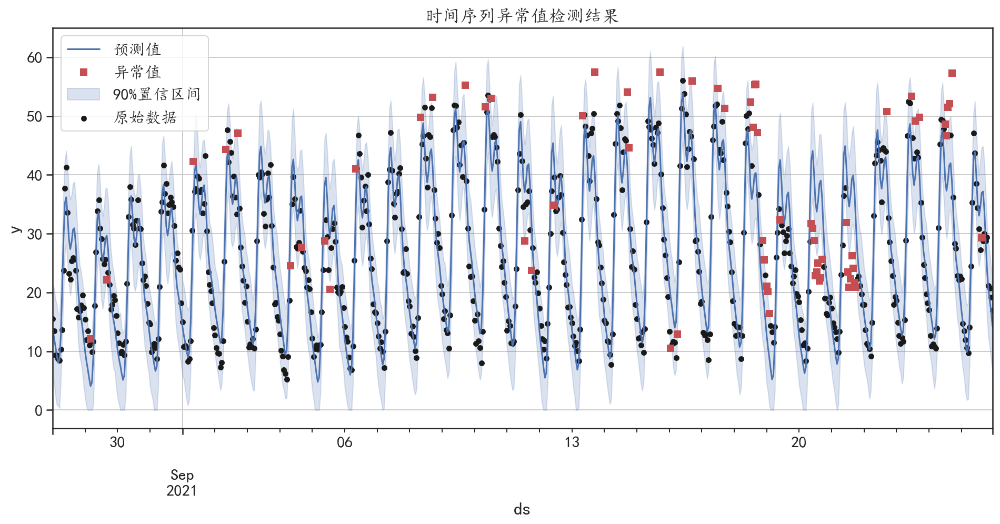

In [29]:
## 同一数据，不同置信度的异常值查找
predf = myusealldf.loc[myusealldf["小区编号"] == 26019005,["时间","number"]]
predf.columns = ["ds","y"]
predf.ds = pd.to_datetime(predf.ds,format = "%Y-%m-%d %H:%M")
## 对该数据建立一个时间序列模型
np.random.seed(1234)  ## 设置随机数种子
model = Prophet(growth="linear",daily_seasonality = True,
                weekly_seasonality=True,yearly_seasonality=False,
                seasonality_mode = 'multiplicative', 
                interval_width = 0.90,   ## 获取90%的置信区间
                )
model = model.fit(predf)     # 使用数据拟合模型
forecast = model.predict(predf)  # 使用模型对数据进行预测
forecast["y"] = predf["y"].reset_index(drop = True)
forecast["yhat"] = np.where(forecast["yhat"]<0,0,forecast["yhat"])
forecast["yhat_lower"] = np.where(forecast["yhat_lower"]<0,0,forecast["yhat_lower"])
## 查看异常值预测情况
outlier_index = outlier_detection(forecast)
outlier_df = predf[outlier_index]
print("异常值的数量为:",np.sum(outlier_index))
## 可视化异常值的结果
fig, ax = plt.subplots()
## 可视化预测值
forecast.plot(x = "ds",y = "yhat",style = "b-",figsize=(16,7),
              label = "预测值",ax=ax)
## 可视化出置信区间
ax.fill_between(forecast["ds"].values, forecast["yhat_lower"], 
                forecast["yhat_upper"],color='b',alpha=.2,
                label = "90%置信区间")
forecast.plot(kind = "scatter",x = "ds",y = "y",c = "k",
              s = 20,label = "原始数据",ax = ax)
## 可视化出异常值的点
outlier_df.plot(x = "ds",y = "y",style = "rs",ax = ax,
                label = "异常值")
plt.legend(loc = 2)
plt.grid()
plt.title("时间序列异常值检测结果")
plt.show()

Initial log joint probability = -10.4101
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1128.6   0.000306573       83.7598      0.4665           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1129.15   4.41284e-05       84.1581      0.1782           1      271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       1129.15   2.55137e-08       76.2364     0.04549      0.4854      312   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
异常值的数量为: 28


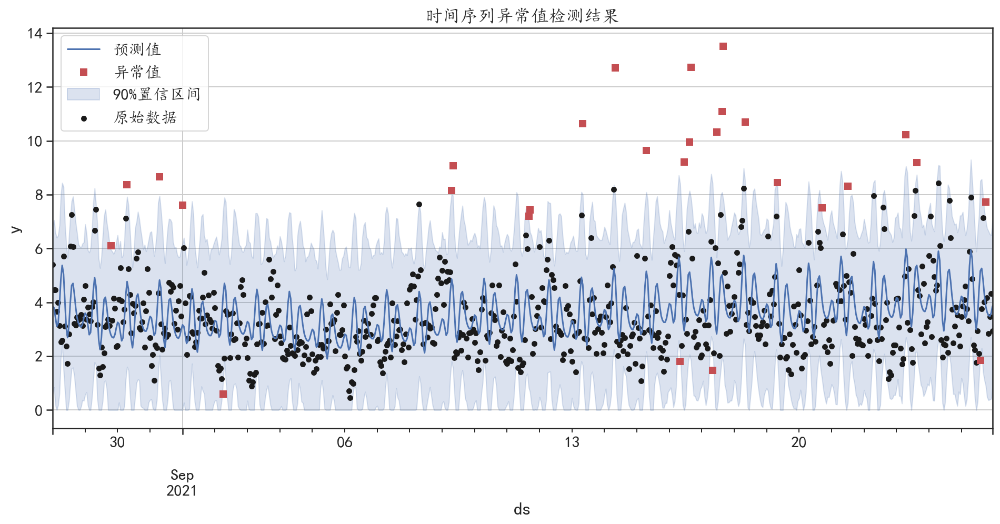

In [30]:
## 查看一个其他数据
predf = myusealldf.loc[myusealldf["小区编号"] == 26019010,["时间","number"]]
predf.columns = ["ds","y"]
predf.ds = pd.to_datetime(predf.ds,format = "%Y-%m-%d %H:%M")
## 对该数据建立一个时间序列模型
np.random.seed(1234)  ## 设置随机数种子
model = Prophet(growth="linear",daily_seasonality = True,
                weekly_seasonality=True,yearly_seasonality=False,
                seasonality_mode = 'multiplicative', 
                interval_width = 0.95,   ## 获取95%的置信区间
                )
model = model.fit(predf)     # 使用数据拟合模型
forecast = model.predict(predf)  # 使用模型对数据进行预测
forecast["y"] = predf["y"].reset_index(drop = True)
forecast["yhat"] = np.where(forecast["yhat"]<0,0,forecast["yhat"])
forecast["yhat_lower"] = np.where(forecast["yhat_lower"]<0,0,forecast["yhat_lower"])
## 查看异常值预测情况
outlier_index = outlier_detection(forecast)
outlier_df = predf[outlier_index]
print("异常值的数量为:",np.sum(outlier_index))
## 可视化异常值的结果
fig, ax = plt.subplots()
## 可视化预测值
forecast.plot(x = "ds",y = "yhat",style = "b-",figsize=(16,7),
              label = "预测值",ax=ax)
## 可视化出置信区间
ax.fill_between(forecast["ds"].values, forecast["yhat_lower"], 
                forecast["yhat_upper"],color='b',alpha=.2,
                label = "90%置信区间")
forecast.plot(kind = "scatter",x = "ds",y = "y",c = "k",
              s = 20,label = "原始数据",ax = ax)
## 可视化出异常值的点
outlier_df.plot(x = "ds",y = "y",style = "rs",ax = ax,
                label = "异常值")
plt.legend(loc = 2)
plt.grid()
plt.title("时间序列异常值检测结果")
plt.show()

Initial log joint probability = -10.4101
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1128.6   0.000306573       83.7598      0.4665           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1129.15   4.41284e-05       84.1581      0.1782           1      271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       1129.15   2.55137e-08       76.2364     0.04549      0.4854      312   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
异常值的数量为: 55


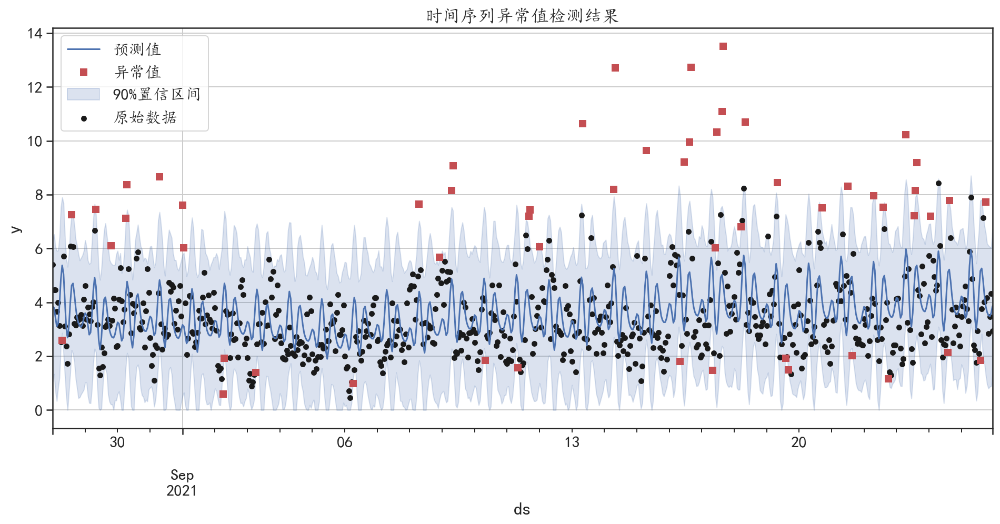

In [31]:
## 同一数据，不同置信度的异常值查找
predf = myusealldf.loc[myusealldf["小区编号"] == 26019010,["时间","number"]]
predf.columns = ["ds","y"]
predf.ds = pd.to_datetime(predf.ds,format = "%Y-%m-%d %H:%M")
## 对该数据建立一个时间序列模型
np.random.seed(1234)  ## 设置随机数种子
model = Prophet(growth="linear",daily_seasonality = True,
                weekly_seasonality=True,yearly_seasonality=False,
                seasonality_mode = 'multiplicative', 
                interval_width = 0.90,   ## 获取90%的置信区间
                )
model = model.fit(predf)     # 使用数据拟合模型
forecast = model.predict(predf)  # 使用模型对数据进行预测
forecast["y"] = predf["y"].reset_index(drop = True)
forecast["yhat"] = np.where(forecast["yhat"]<0,0,forecast["yhat"])
forecast["yhat_lower"] = np.where(forecast["yhat_lower"]<0,0,forecast["yhat_lower"])
## 查看异常值预测情况
outlier_index = outlier_detection(forecast)
outlier_df = predf[outlier_index]
print("异常值的数量为:",np.sum(outlier_index))
## 可视化异常值的结果
fig, ax = plt.subplots()
## 可视化预测值
forecast.plot(x = "ds",y = "yhat",style = "b-",figsize=(16,7),
              label = "预测值",ax=ax)
## 可视化出置信区间
ax.fill_between(forecast["ds"].values, forecast["yhat_lower"], 
                forecast["yhat_upper"],color='b',alpha=.2,
                label = "90%置信区间")
forecast.plot(kind = "scatter",x = "ds",y = "y",c = "k",
              s = 20,label = "原始数据",ax = ax)
## 可视化出异常值的点
outlier_df.plot(x = "ds",y = "y",style = "rs",ax = ax,
                label = "异常值")
plt.legend(loc = 2)
plt.grid()
plt.title("时间序列异常值检测结果")
plt.show()

Initial log joint probability = -10.4101
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1128.6   0.000306573       83.7598      0.4665           1      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       1129.15   4.41284e-05       84.1581      0.1782           1      271   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       1129.15   2.55137e-08       76.2364     0.04549      0.4854      312   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
异常值的数量为: 19


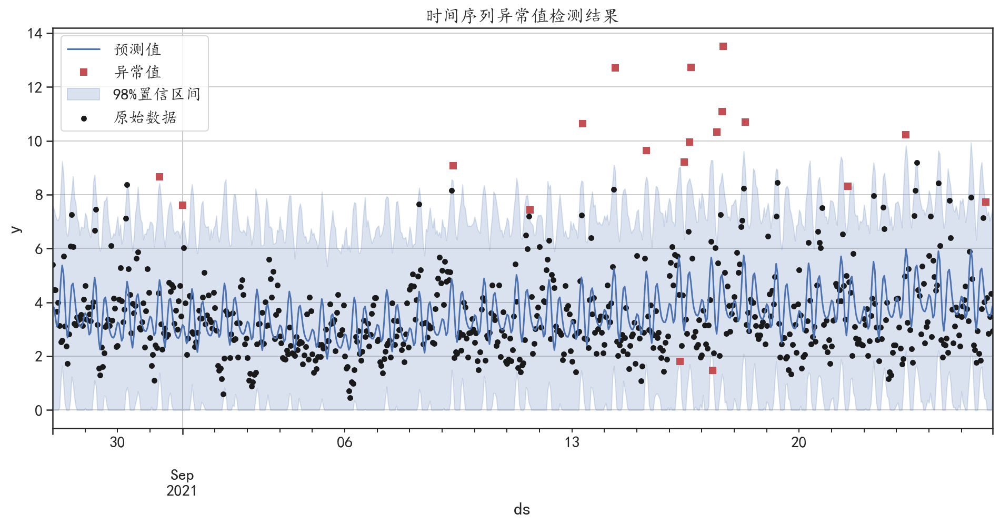

In [32]:
## 查看一个其他数据
predf = myusealldf.loc[myusealldf["小区编号"] == 26019010,["时间","number"]]
predf.columns = ["ds","y"]
predf.ds = pd.to_datetime(predf.ds,format = "%Y-%m-%d %H:%M")
## 对该数据建立一个时间序列模型
np.random.seed(1234)  ## 设置随机数种子
model = Prophet(growth="linear",daily_seasonality = True,
                weekly_seasonality=True,yearly_seasonality=False,
                seasonality_mode = 'multiplicative', 
                interval_width = 0.98,   ## 获取98%的置信区间
                )
model = model.fit(predf)     # 使用数据拟合模型
forecast = model.predict(predf)  # 使用模型对数据进行预测
forecast["y"] = predf["y"].reset_index(drop = True)
forecast["yhat"] = np.where(forecast["yhat"]<0,0,forecast["yhat"])
forecast["yhat_lower"] = np.where(forecast["yhat_lower"]<0,0,forecast["yhat_lower"])
## 查看异常值预测情况
outlier_index = outlier_detection(forecast)
outlier_df = predf[outlier_index]
print("异常值的数量为:",np.sum(outlier_index))
## 可视化异常值的结果
fig, ax = plt.subplots()
## 可视化预测值
forecast.plot(x = "ds",y = "yhat",style = "b-",figsize=(16,7),
              label = "预测值",ax=ax)
## 可视化出置信区间
ax.fill_between(forecast["ds"].values, forecast["yhat_lower"], 
                forecast["yhat_upper"],color='b',alpha=.2,
                label = "98%置信区间")
forecast.plot(kind = "scatter",x = "ds",y = "y",c = "k",
              s = 20,label = "原始数据",ax = ax)
## 可视化出异常值的点
outlier_df.plot(x = "ds",y = "y",style = "rs",ax = ax,
                label = "异常值")
plt.legend(loc = 2)
plt.grid()
plt.title("时间序列异常值检测结果")
plt.show()

#### 异常值数量往往是少数的情况，因此使用置信度为95%获得的异常值数量，更合适（个人认为），异常区间可以根据附近是否有异常值的聚集进行判断。

## 而且还可以使用其它的时间序列模型进行异常值数据的发现和识别

In [33]:
outlier_df

,ds,y
4587,2021-08-31 07:00:00,8.6683
5573,2021-09-01 00:00:00,7.6025
17173,2021-09-09 08:00:00,9.0672
20479,2021-09-11 17:00:00,7.4256
22741,2021-09-13 08:00:00,10.6269
24133,2021-09-14 08:00:00,12.7124
25467,2021-09-15 07:00:00,9.6444
26917,2021-09-16 08:00:00,1.8006
27091,2021-09-16 11:00:00,9.2128
27323,2021-09-16 15:00:00,9.9558
